In [1]:
import numpy as np
import cv2
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt


In [2]:
meta_df=pd.read_csv(r'C:\Users\HazemHaroun\hazem\Hacking_the_human_body_competition\data\raw_dataset\competition_data\meta_file\train.csv')

In [3]:
meta_df

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
0,10044,prostate,HPA,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,37.0,Male
1,10274,prostate,HPA,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,76.0,Male
2,10392,spleen,HPA,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,82.0,Male
3,10488,lung,HPA,3000,3000,0.4,4,3446519 15 3449517 17 3452514 20 3455510 24 34...,78.0,Male
4,10610,spleen,HPA,3000,3000,0.4,4,478925 68 481909 87 484893 105 487863 154 4908...,21.0,Female
...,...,...,...,...,...,...,...,...,...,...
346,9517,kidney,HPA,3000,3000,0.4,4,1611763 11 1614753 29 1617750 35 1620746 43 16...,61.0,Male
347,9769,kidney,HPA,3070,3070,0.4,4,4030400 28 4033466 34 4036526 48 4039594 54 40...,28.0,Male
348,9777,largeintestine,HPA,3000,3000,0.4,4,538473 13 541468 22 544463 30 547461 35 550459...,84.0,Male
349,9791,kidney,HPA,3000,3000,0.4,4,334733 33 337729 43 340729 43 343725 51 346723...,28.0,Male


In [4]:
meta_df['id'].count()

351

##### In the competition data notes, 550 image would be expected in the hidden dataset , and as we can see our training data is consists of 351 image for all classes

In [5]:
print(meta_df['organ'].value_counts())
print(meta_df['organ'].value_counts()/meta_df['organ'].value_counts().sum())

kidney            99
prostate          93
largeintestine    58
spleen            53
lung              48
Name: organ, dtype: int64
kidney            0.282051
prostate          0.264957
largeintestine    0.165242
spleen            0.150997
lung              0.136752
Name: organ, dtype: float64


##### As we can see, the ratio of class occurances is merely bias, the most common classes is the kidney and the prostate, which have similar ratios. then comes in second place the large intestine , spleen and lung with similar ratios as well.

In [6]:
organ_names=meta_df['organ'].value_counts().index.tolist()
organs_value_counts=meta_df['organ'].value_counts()
organs_ratios=organs_value_counts/organs_value_counts.sum()


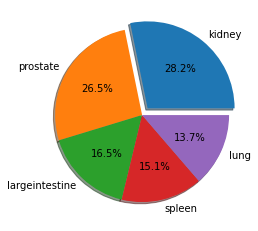

In [7]:
# (meta_df['organ'].value_counts()/meta_df['organ'].value_counts().sum()).plot.pie(y='organ')
expand=np.float32((organs_value_counts==organs_value_counts.max()).values)*0.1
plt.pie(
    x=organs_ratios,
    labels=organ_names,
    colors=sn.color_palette(n_colors=len(organ_names)),
    explode=expand,
    autopct="%1.1f%%",
    pctdistance=0.6,
    shadow=True
    );

##### Lets investigate the data source our dataset collected from

In [8]:
meta_df['data_source'].unique()

array(['HPA'], dtype=object)

##### Looks like all our training data consists of the HPA data source, and all our test data will be either a mix of HPA and HuBMAP or only HuBMAP which makes a challenge to test on a totally different dataset distribution

##### Lets check the distribution of the images sizes we have in our dataset

<AxesSubplot:xlabel='img_height'>

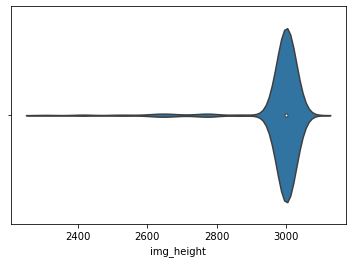

In [9]:
# meta_df['img_height']
sn.violinplot(data=meta_df,x='img_height')

<AxesSubplot:xlabel='img_width'>

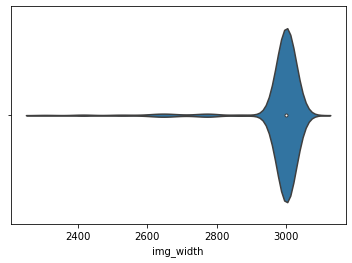

In [10]:
sn.violinplot(data=meta_df,x='img_width')

In [11]:
print('IMAGE WIDHT MAX AND MIN :',meta_df['img_width'].max(),meta_df['img_width'].min())
print('IMAGE HEIGHT MAX AND MIN :',meta_df['img_height'].max(),meta_df['img_height'].min())

IMAGE WIDHT MAX AND MIN : 3070 2308
IMAGE HEIGHT MAX AND MIN : 3070 2308


##### Looks like training data have very large images sizes with max 3070 and min 2308 pixel

##### Lets investigate the gender ratios 

In [12]:
gender_types=meta_df['sex'].value_counts().index.tolist()
gender_value_counts=meta_df['sex'].value_counts()
gender_ratios=gender_value_counts/gender_value_counts.sum()
print(gender_value_counts)
print(gender_ratios)

Male      229
Female    122
Name: sex, dtype: int64
Male      0.652422
Female    0.347578
Name: sex, dtype: float64


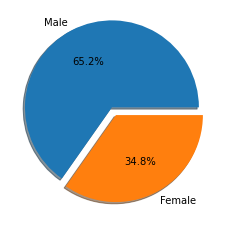

In [13]:
expand=np.float32((gender_value_counts==gender_value_counts.max()).values)*0.1
plt.pie(
    x=gender_ratios,
    labels=gender_types,
    colors=sn.color_palette(n_colors=len(gender_types)),
    explode=expand,
    autopct="%1.1f%%",
    pctdistance=0.6,
    shadow=True
    );

##### looks like most of the images are taken from male dononrs rather than female 

##### Lets investigate the correlation of gender with the organ factors

In [14]:
female_organs=meta_df[meta_df['sex']=='Female']['organ'].value_counts()
female_organ_types=female_organs.value_counts().index.tolist()
female_organs['prostate']=0
female_organs_ratio=female_organs/female_organs.sum()
male_organs=meta_df[meta_df['sex']=='Male']['organ'].value_counts()
male_organ_types=male_organs.value_counts().index.tolist()
male_organs_ratio=male_organs/male_organs.sum()
print(female_organs)
print(female_organs_ratio)
print(male_organs)
print(male_organs_ratio)

kidney            37
largeintestine    32
spleen            28
lung              25
prostate           0
Name: organ, dtype: int64
kidney            0.303279
largeintestine    0.262295
spleen            0.229508
lung              0.204918
prostate          0.000000
Name: organ, dtype: float64
prostate          93
kidney            62
largeintestine    26
spleen            25
lung              23
Name: organ, dtype: int64
prostate          0.406114
kidney            0.270742
largeintestine    0.113537
spleen            0.109170
lung              0.100437
Name: organ, dtype: float64


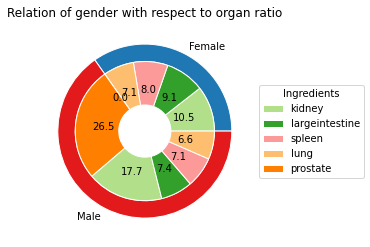

In [15]:
fig, ax = plt.subplots()

size = 0.8
vals = np.array([female_organs.to_list(),male_organs.to_list()])
organ_cmap = plt.colormaps["Paired"]
gender_cmap = plt.colormaps["Paired"]

outer_colors = gender_cmap([1,5])
inner_colors = organ_cmap([2,3,4,6,7,7,2,3,4,6])
ax.pie(vals.sum(axis=1), radius=1, colors=outer_colors,
       wedgeprops=dict(width=0.2, edgecolor='w'),
       labels=['Female','Male'])
wedges, texts,autopcy = ax.pie(vals.flatten(), radius=0.8, colors=inner_colors,
       wedgeprops=dict(width=0.5, edgecolor='w'),autopct="%0.1f")

ax.legend(wedges, female_organs.index.tolist(),#+male_organs.index.tolist(),
          title="Ingredients",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))


ax.set(aspect="equal", title='Relation of gender with respect to organ ratio')
plt.show()

##### As we can see, all of the prostate donars are males (obviousely), all other organs are nearly balanaced 

##### Clearly the age factor is playing a huge role in this problem, lets investigate it

<AxesSubplot:xlabel='age'>

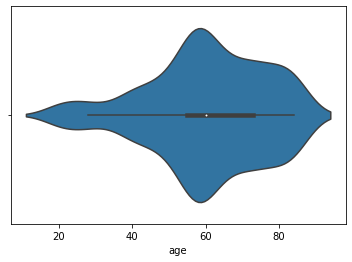

In [16]:
sn.violinplot(data=meta_df,x='age')

<AxesSubplot:xlabel='age'>

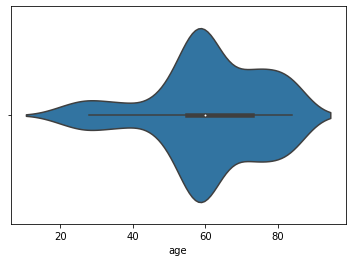

In [17]:
sn.violinplot(data=meta_df[meta_df['sex']=='Male'],x='age')

<AxesSubplot:xlabel='age'>

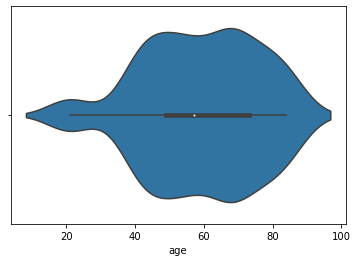

In [18]:
sn.violinplot(data=meta_df[meta_df['sex']=='Female'],x='age')

##### Looks like there is a fair distribution from all ages donating its cells, but a side info, looks like mid age females is more prune to become donars

##### Enough with data investigation, lets take a look at our image data

In [19]:
import os
def rle2mask(mask_rle, shape=(1600,256)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T
img_dir=r'C:\Users\HazemHaroun\hazem\Hacking_the_human_body_competition\data\raw_dataset\competition_data\img'
def vis_cell_and_mask(index,meta_df):
    row=meta_df.iloc[index]
    # print(row)
    donar_id=row['id']
    # print(donar_id)
    img_path=os.path.join(img_dir,f"{donar_id}.png")
    # print(img_path)
    plt.figure(figsize=(15, 15))
    plt.imshow(cv2.imread(img_path))
    plt.imshow(rle2mask(row['rle'],shape=(row['img_width'],row['img_height'])),cmap='coolwarm',alpha=0.5)
    plt.axis("off")
    plt.show()
    return 


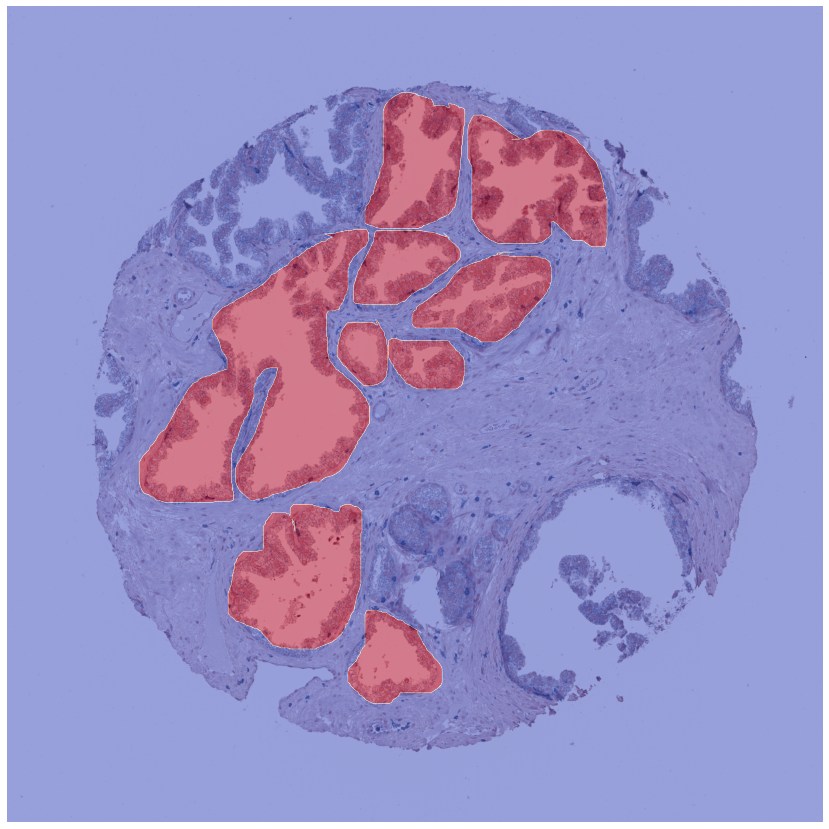

In [20]:
vis_cell_and_mask(0,meta_df)

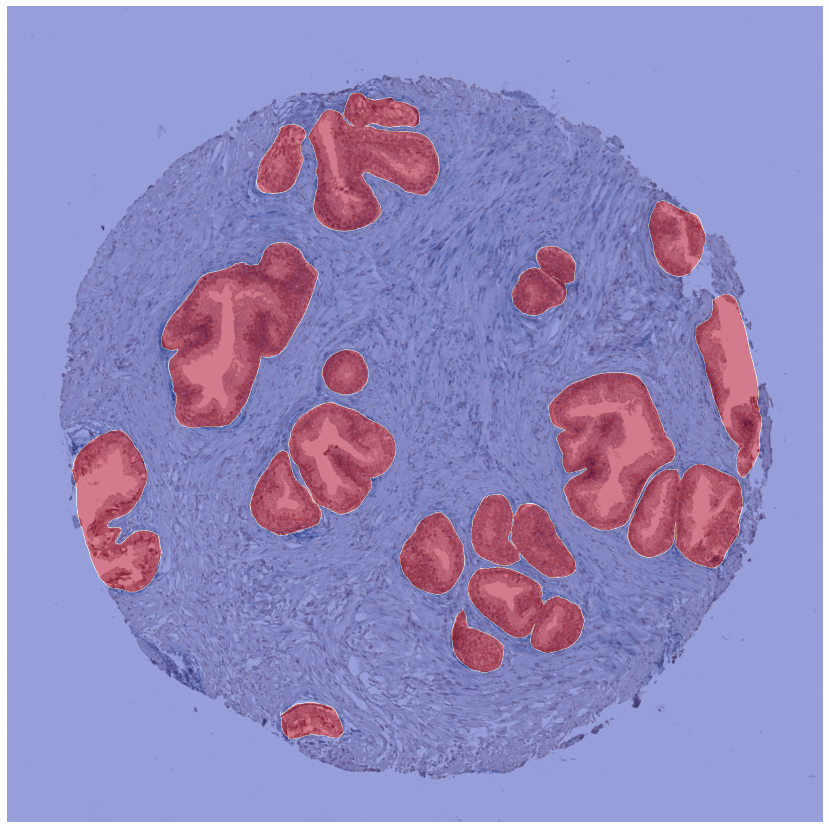

In [21]:
vis_cell_and_mask(1,meta_df)

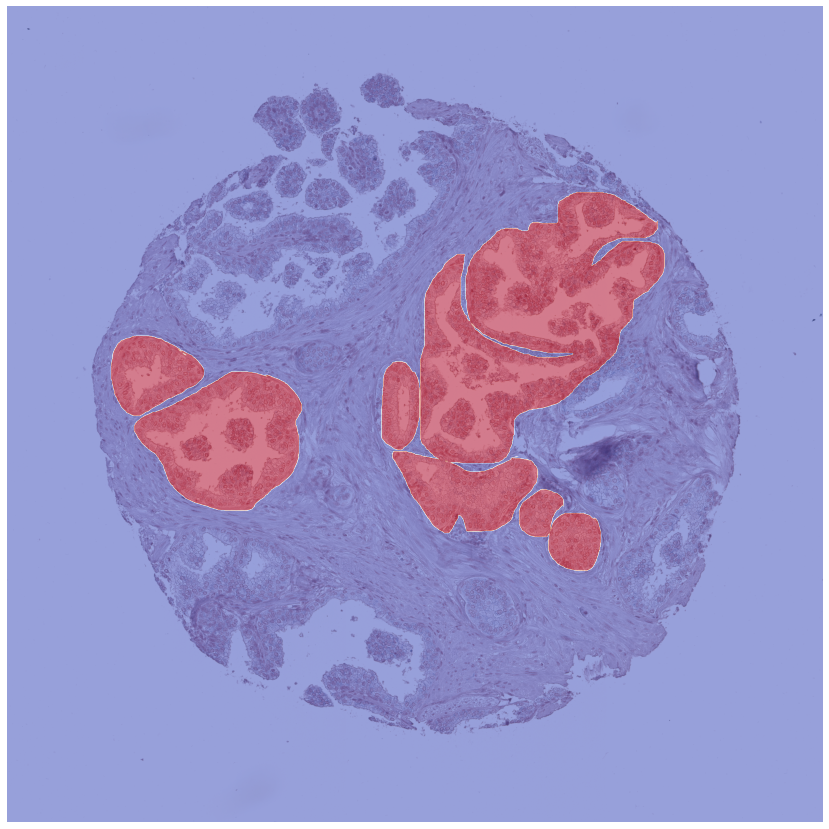

In [22]:
vis_cell_and_mask(10,meta_df)

##### Lets visualize cells from different organs 

###### Prostate

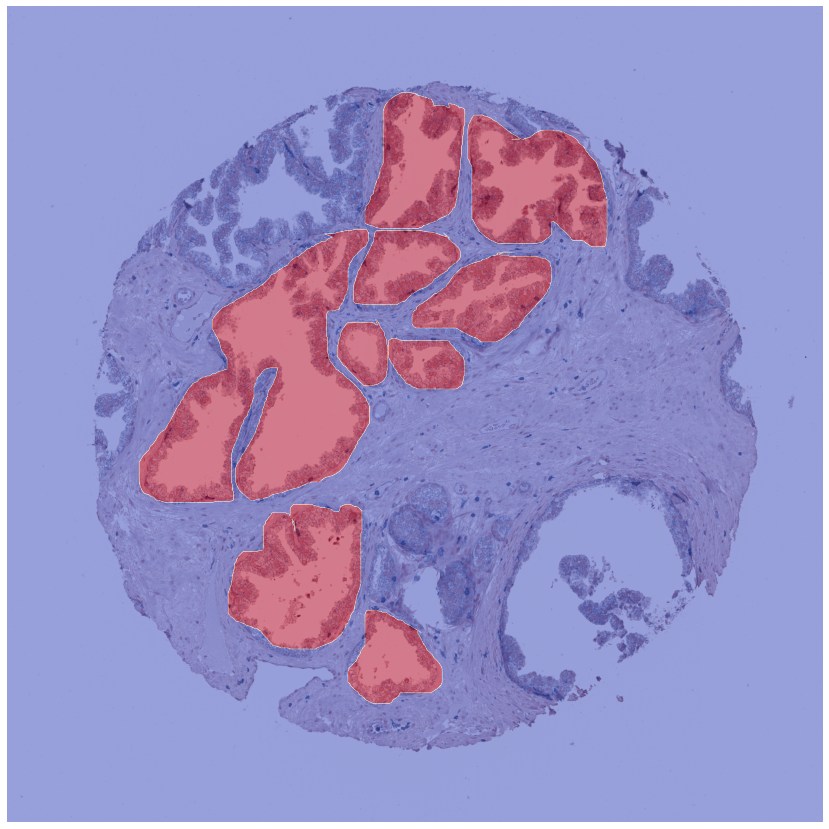

In [23]:
vis_cell_and_mask(0,meta_df[meta_df['organ']=='prostate'])

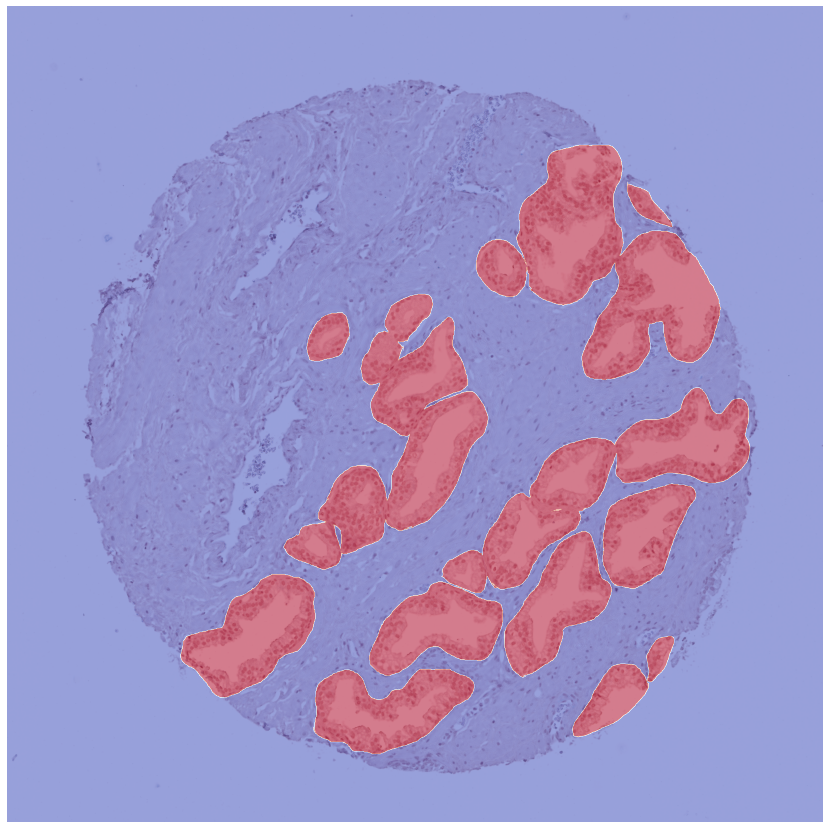

In [24]:
vis_cell_and_mask(5,meta_df[meta_df['organ']=='prostate'])

###### Lung

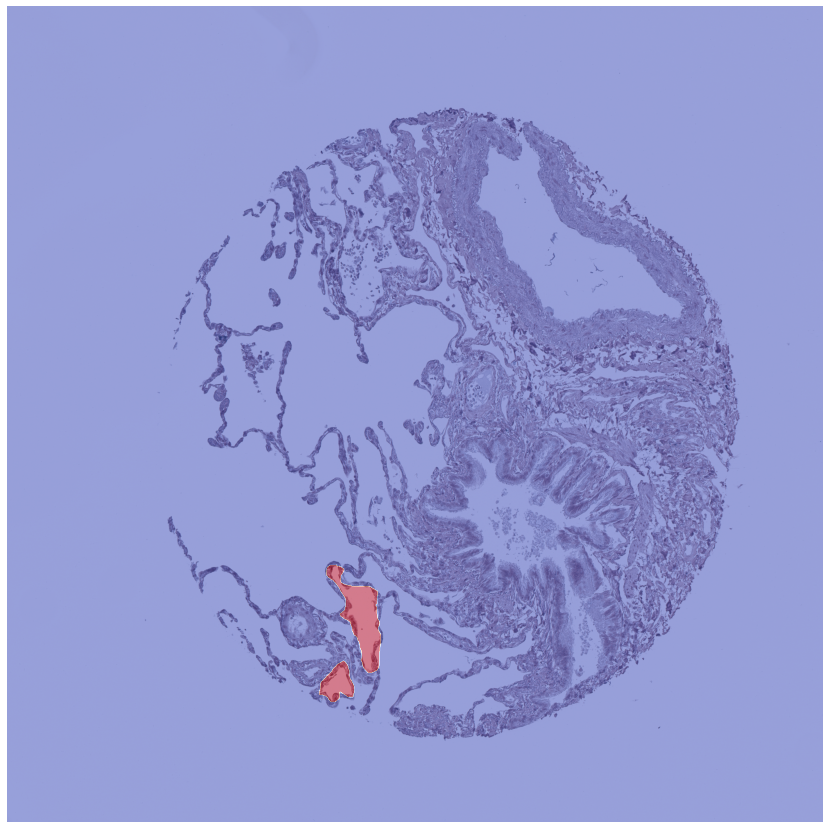

In [25]:
vis_cell_and_mask(0,meta_df[meta_df['organ']=='lung'])

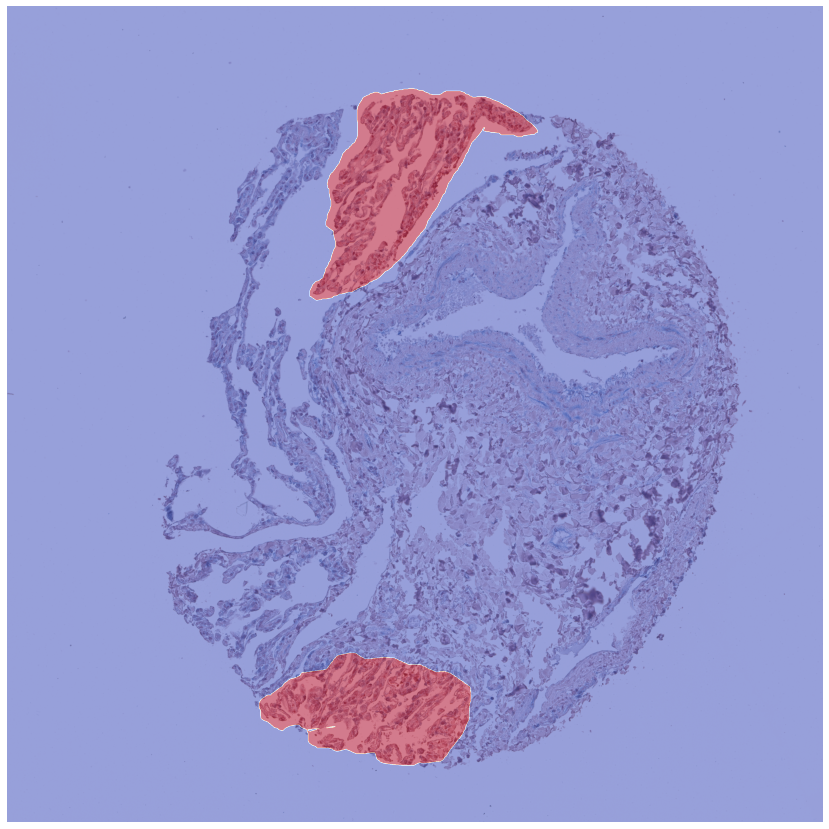

In [26]:
vis_cell_and_mask(5,meta_df[meta_df['organ']=='lung'])

###### Spleen

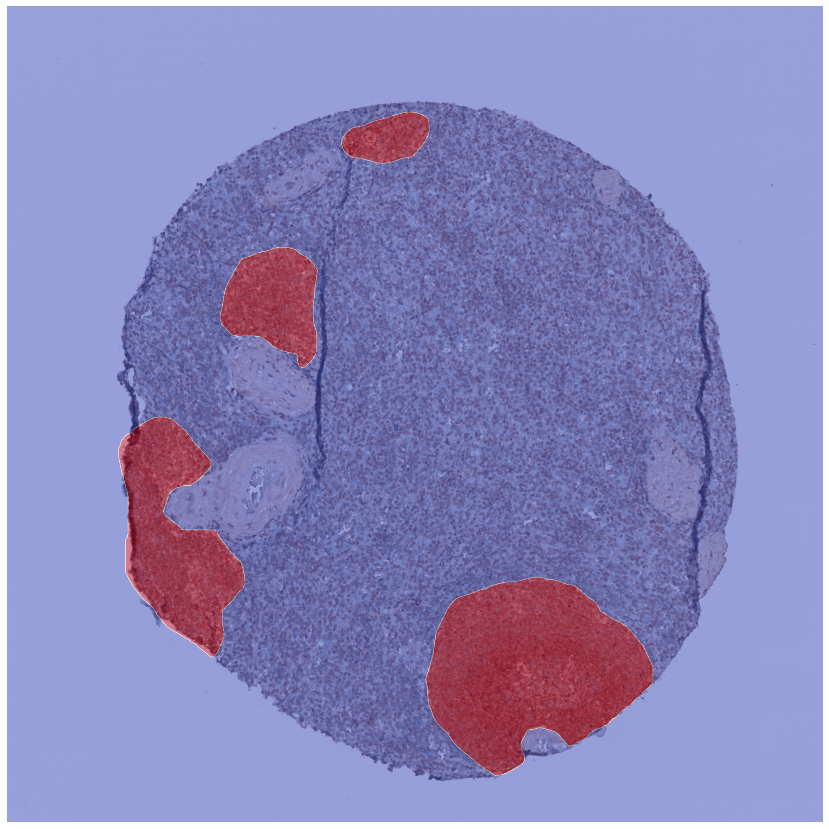

In [27]:
vis_cell_and_mask(0,meta_df[meta_df['organ']=='spleen'])

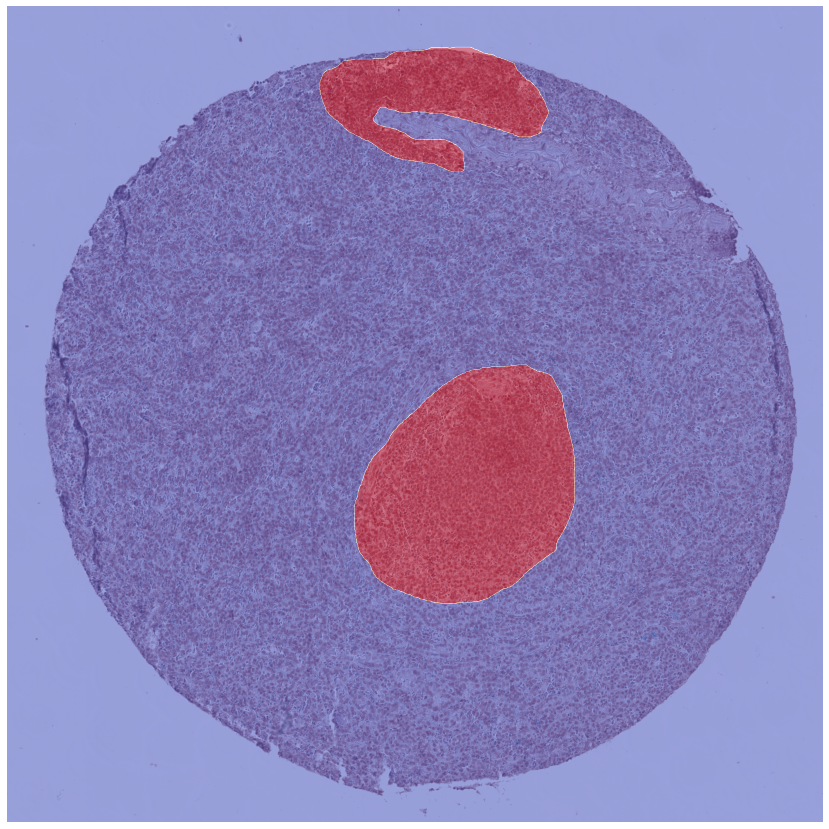

In [28]:
vis_cell_and_mask(5,meta_df[meta_df['organ']=='spleen'])

###### Large intestine

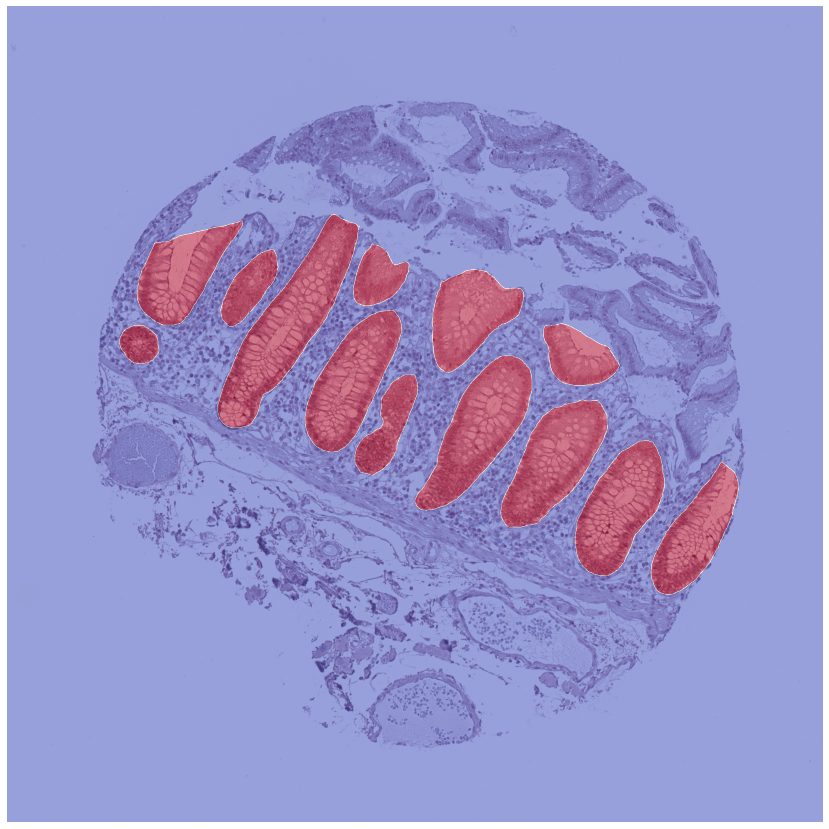

In [29]:
vis_cell_and_mask(0,meta_df[meta_df['organ']=='largeintestine'])

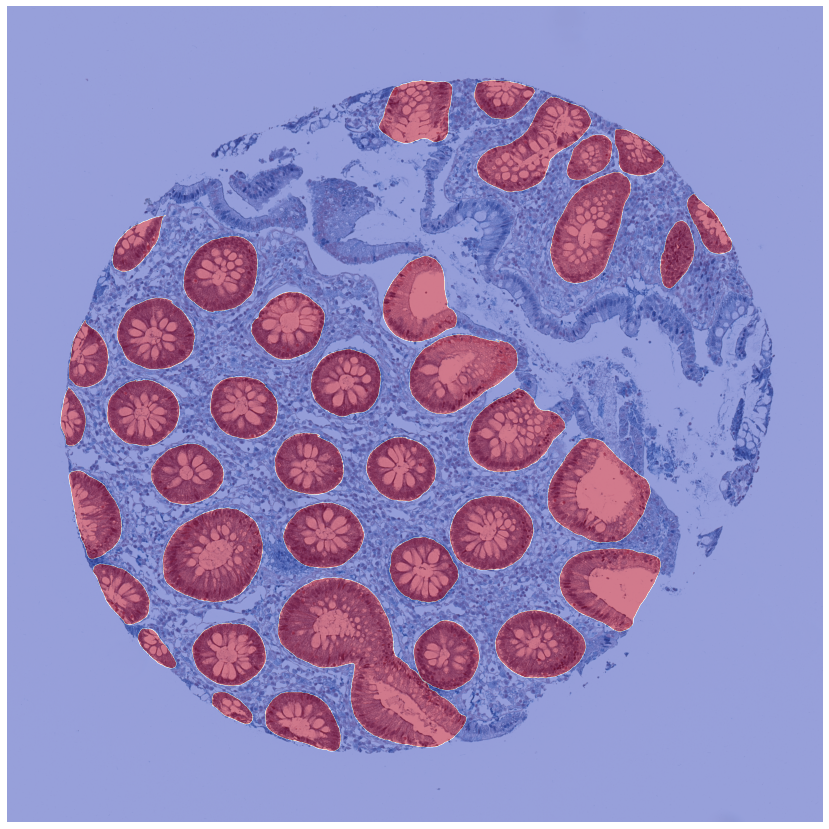

In [30]:
vis_cell_and_mask(5,meta_df[meta_df['organ']=='largeintestine'])

###### Kidney

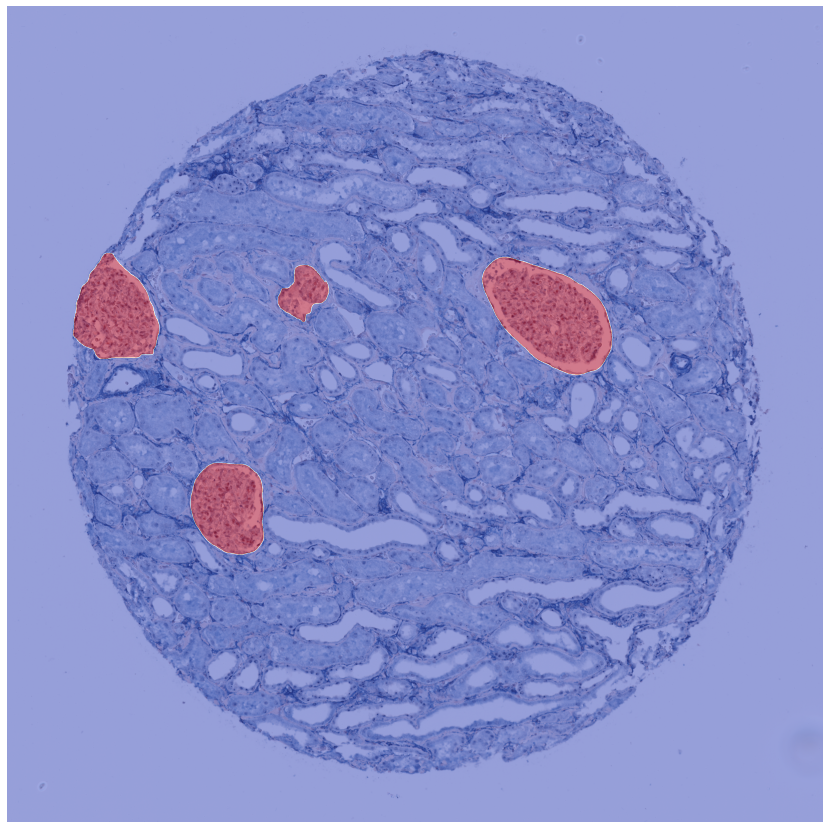

In [31]:
vis_cell_and_mask(0,meta_df[meta_df['organ']=='kidney'])

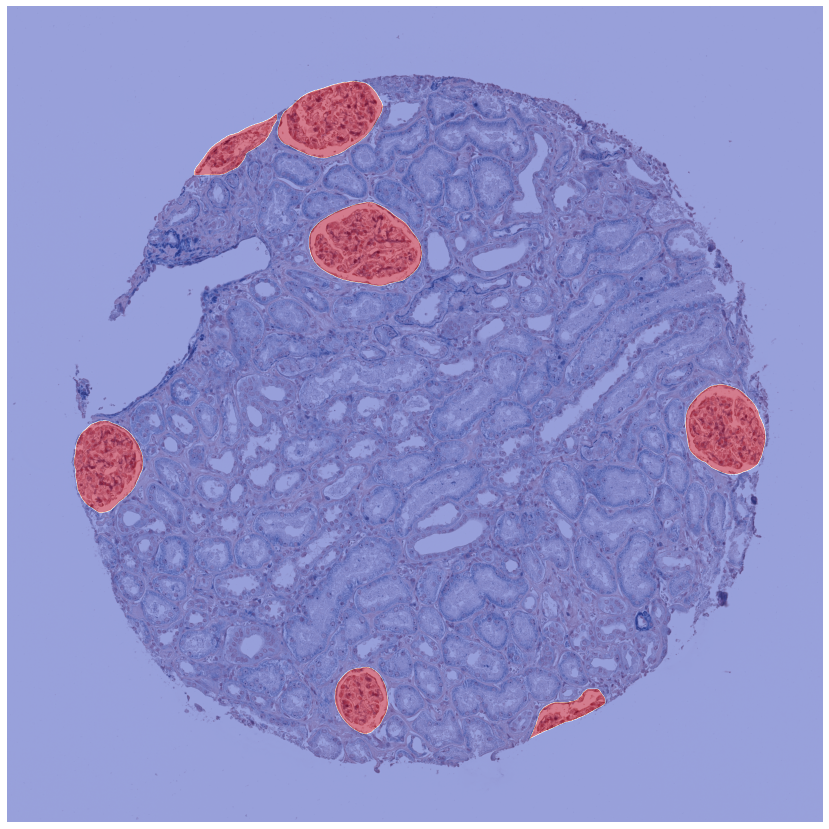

In [32]:
vis_cell_and_mask(5,meta_df[meta_df['organ']=='kidney'])

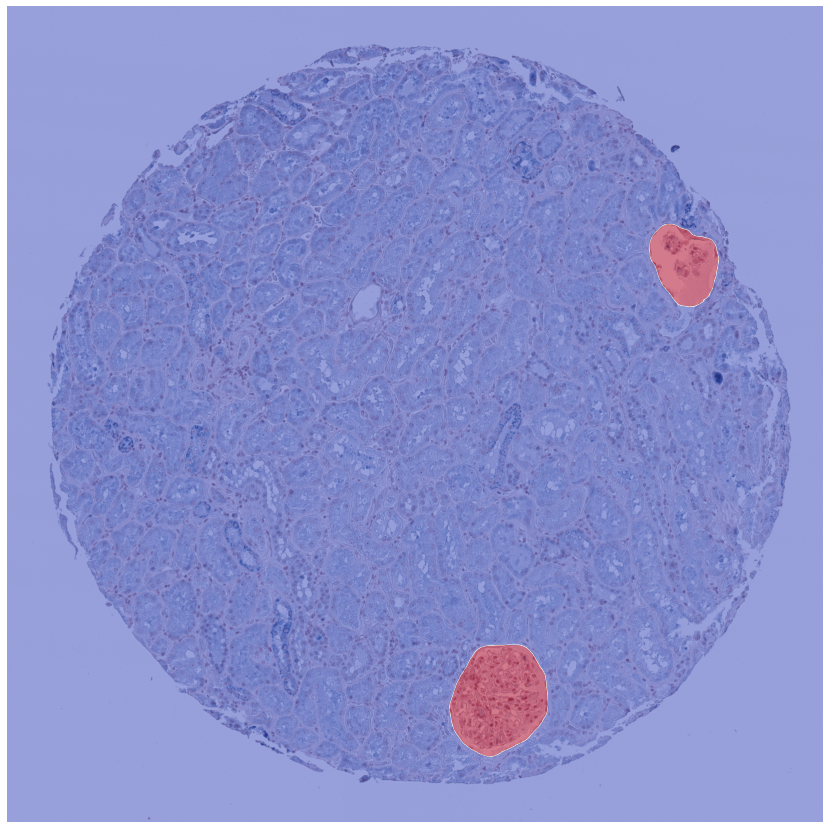

In [38]:
vis_cell_and_mask(0,meta_df[(meta_df['organ']=='kidney') & (meta_df['sex']=='Male')])

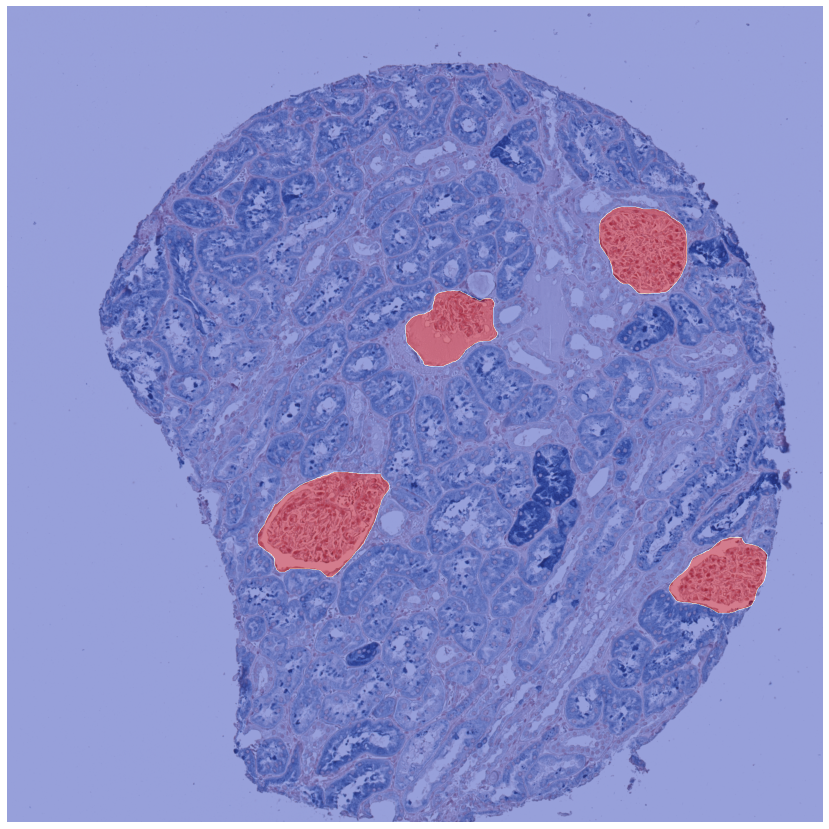

In [39]:
vis_cell_and_mask(1,meta_df[(meta_df['organ']=='kidney') & (meta_df['sex']=='Male')])

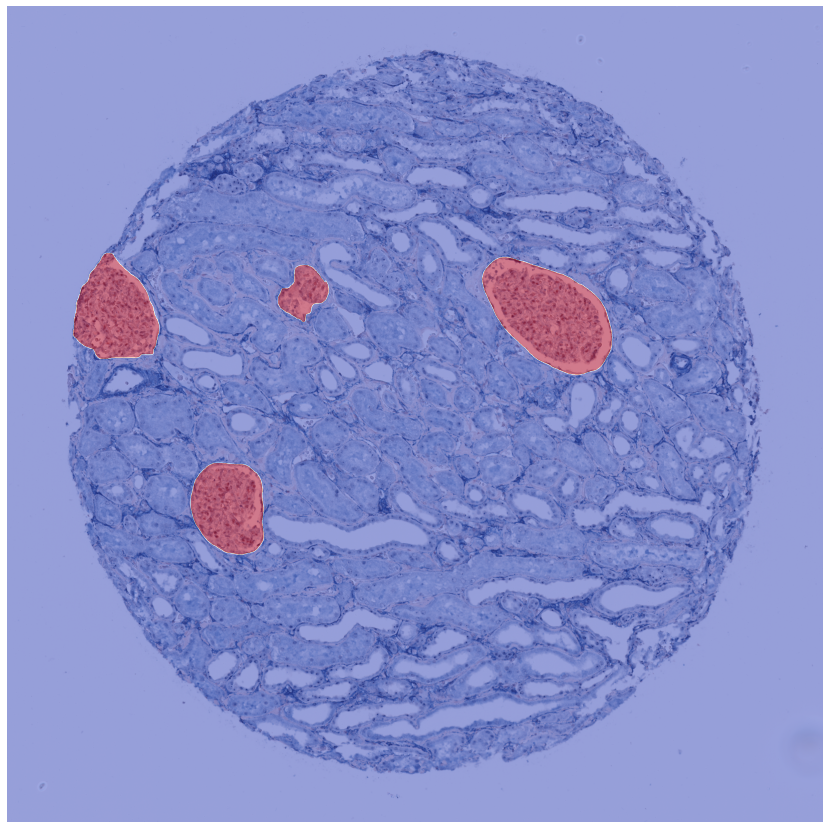

In [40]:
vis_cell_and_mask(0,meta_df[(meta_df['organ']=='kidney') & (meta_df['sex']=='Female')])

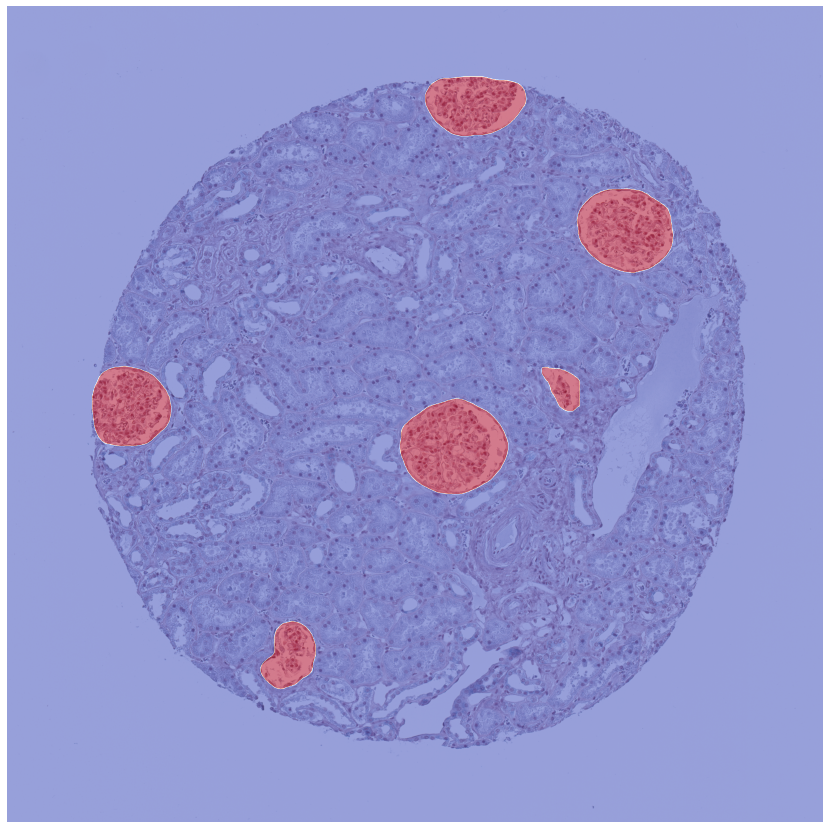

In [41]:
vis_cell_and_mask(1,meta_df[(meta_df['organ']=='kidney') & (meta_df['sex']=='Female')])